Visual Saliency Detection

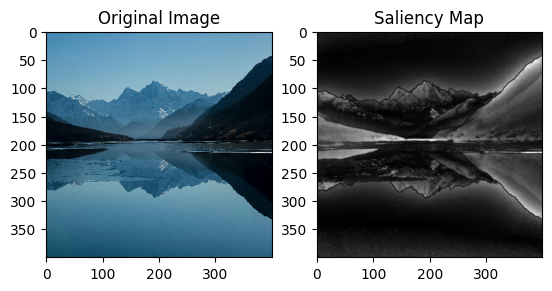

In [1]:
import cv2
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('p1.jpg')
img = cv2.resize(img, (400, 400))
saliency = cv2.saliency.StaticSaliencyFineGrained_create()

(success, saliencyMap) = saliency.computeSaliency(img)
saliencyMap = (saliencyMap * 255).astype("uint8")

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(saliencyMap, cmap='gray')
plt.title("Saliency Map")
plt.show()


Frame 0


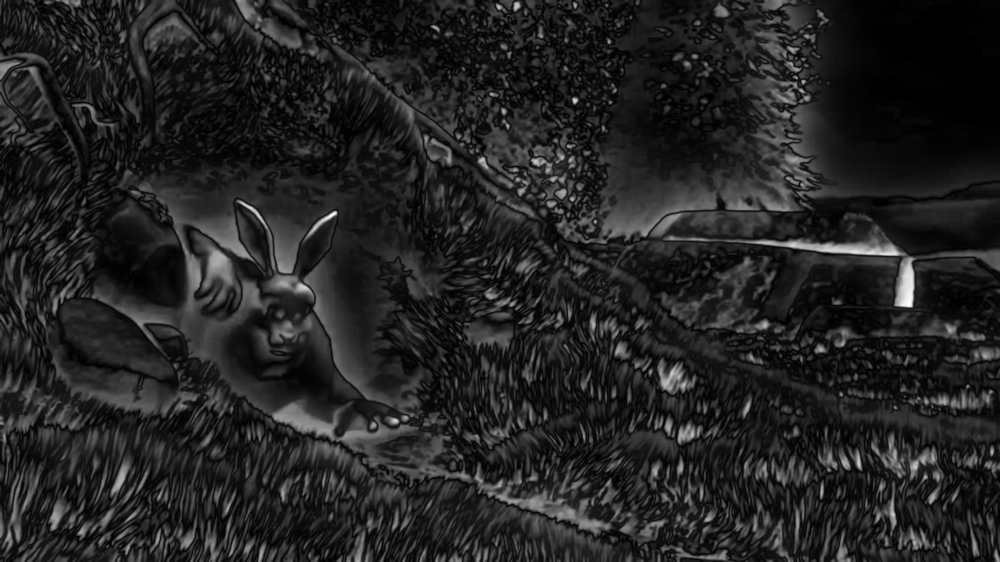

Frame 1


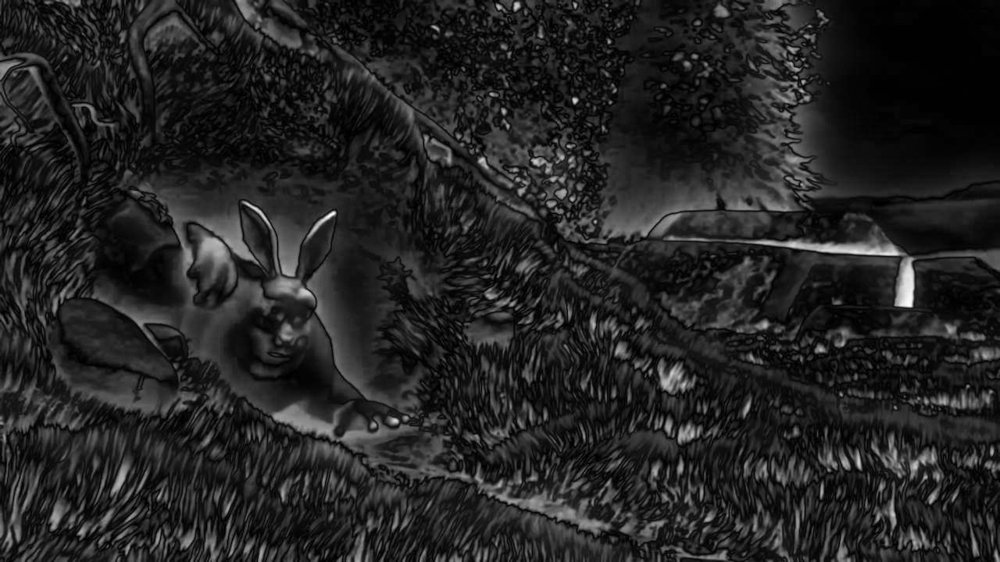

Frame 2


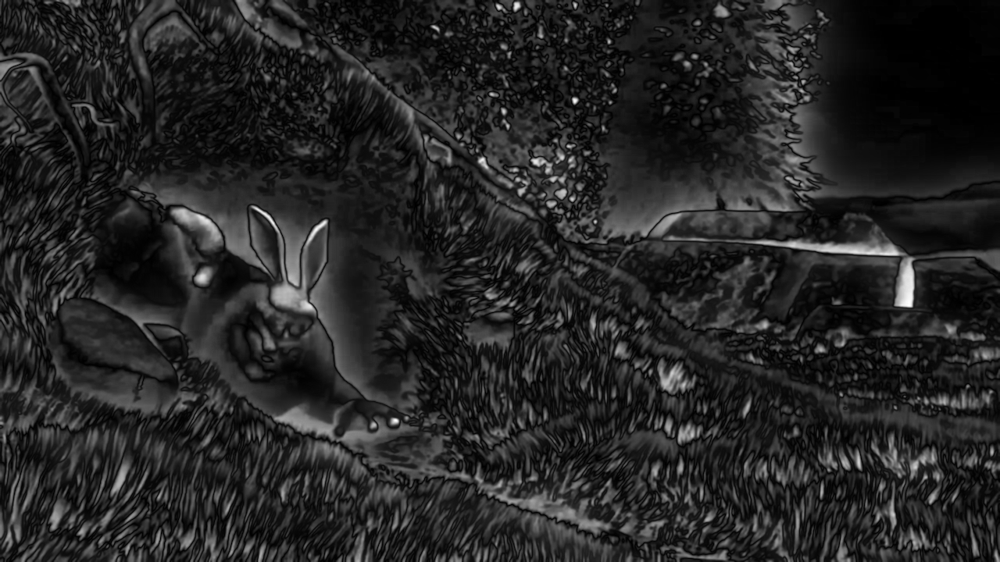

Frame 3


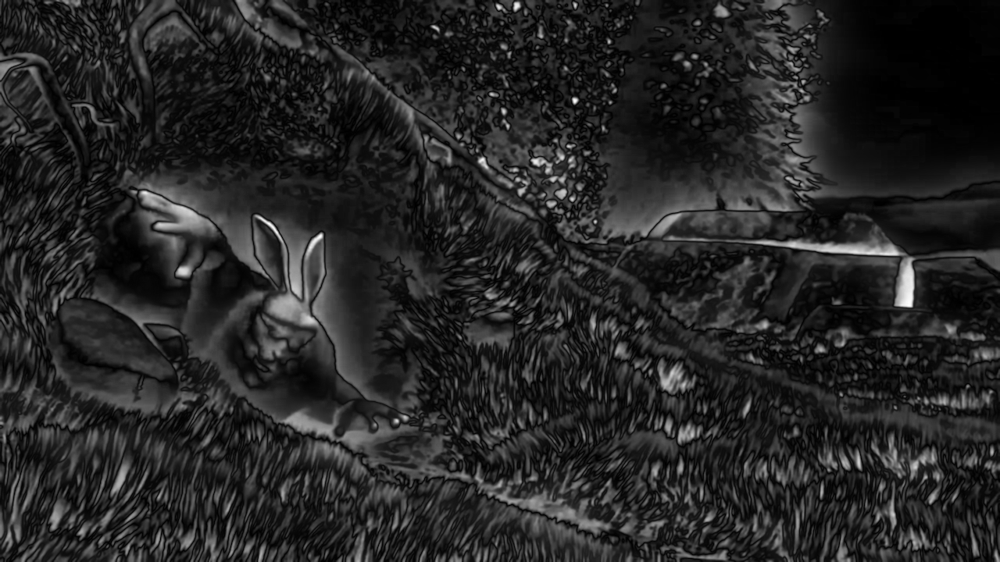

Frame 4


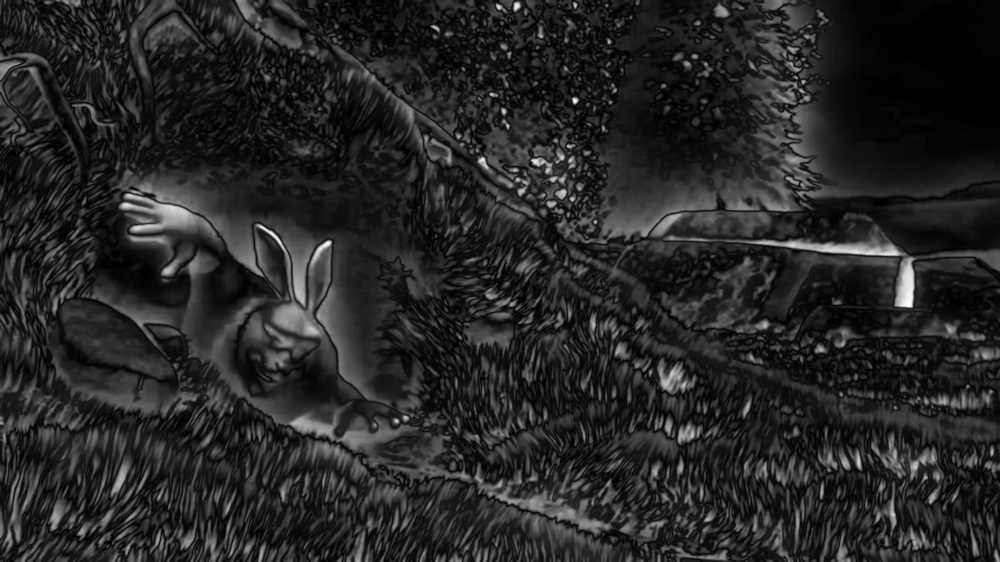

Frame 5


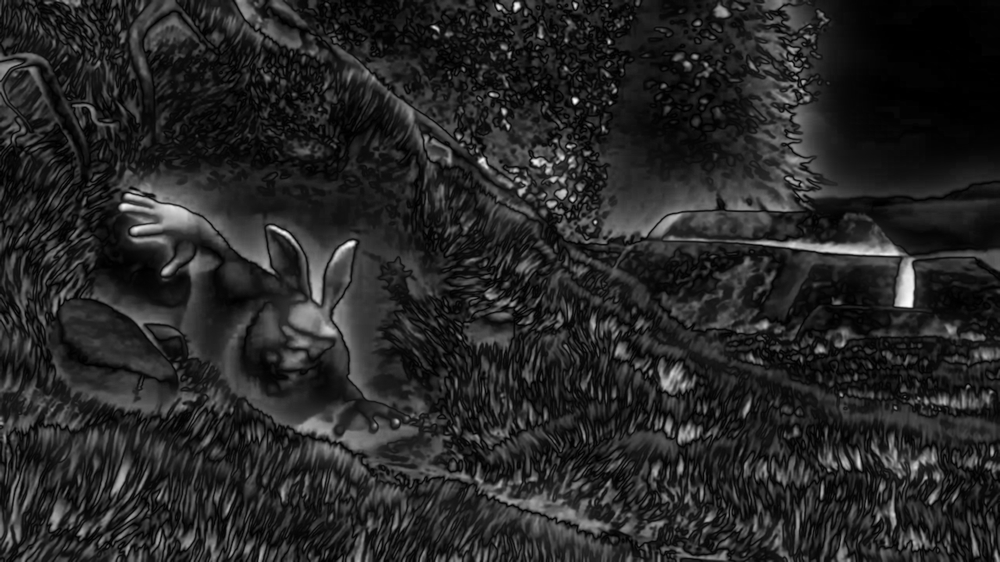

Frame 6


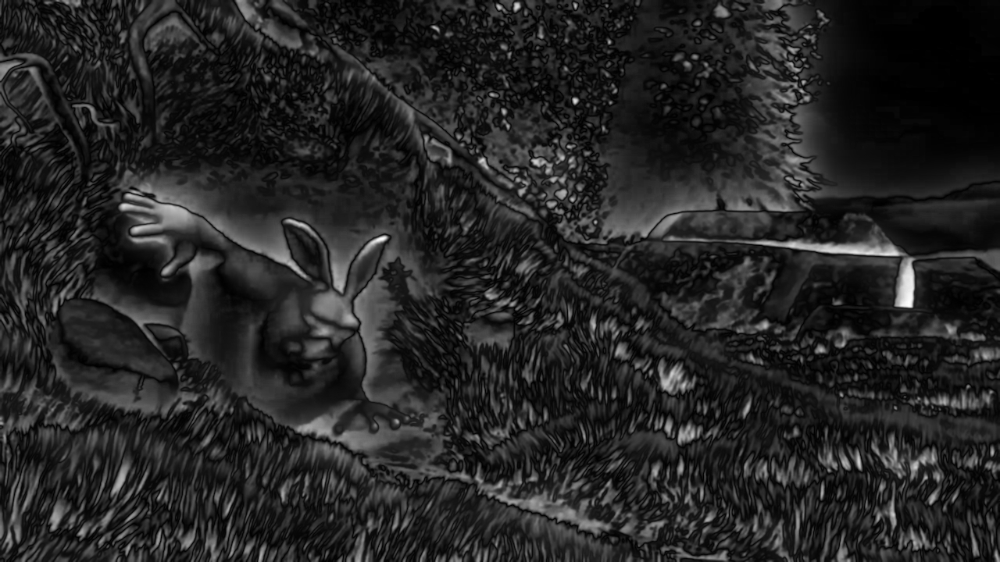

Frame 7


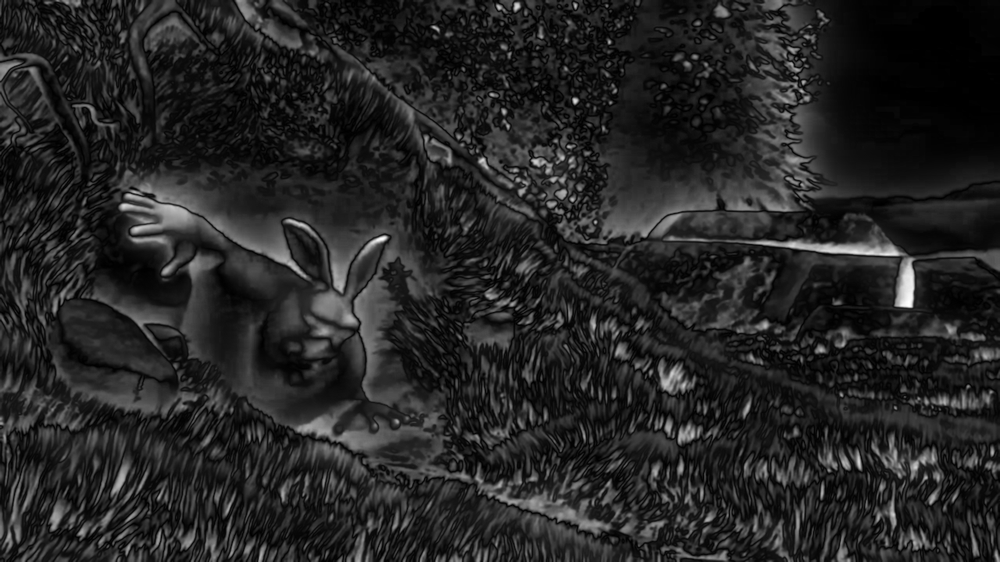

Frame 8


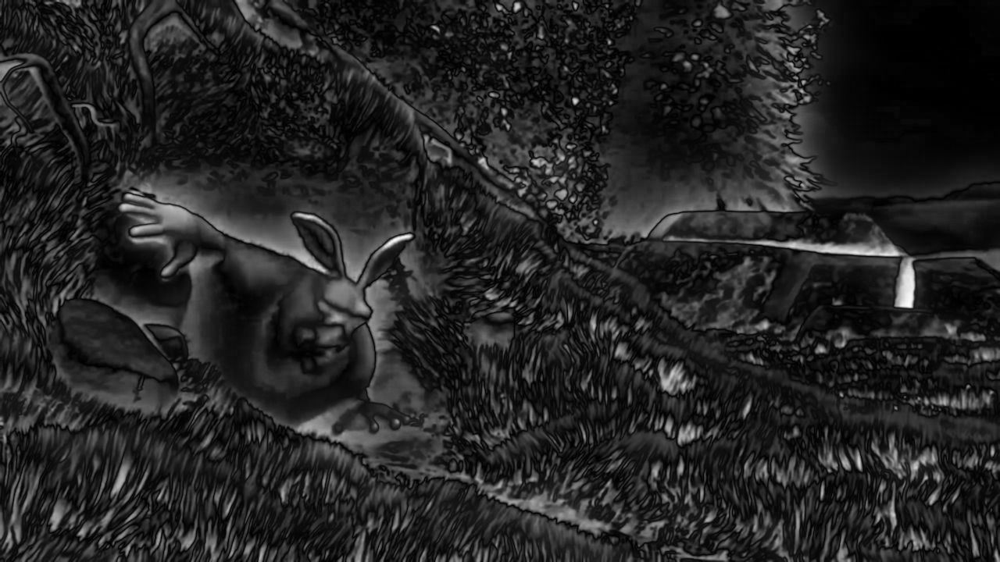

Frame 9


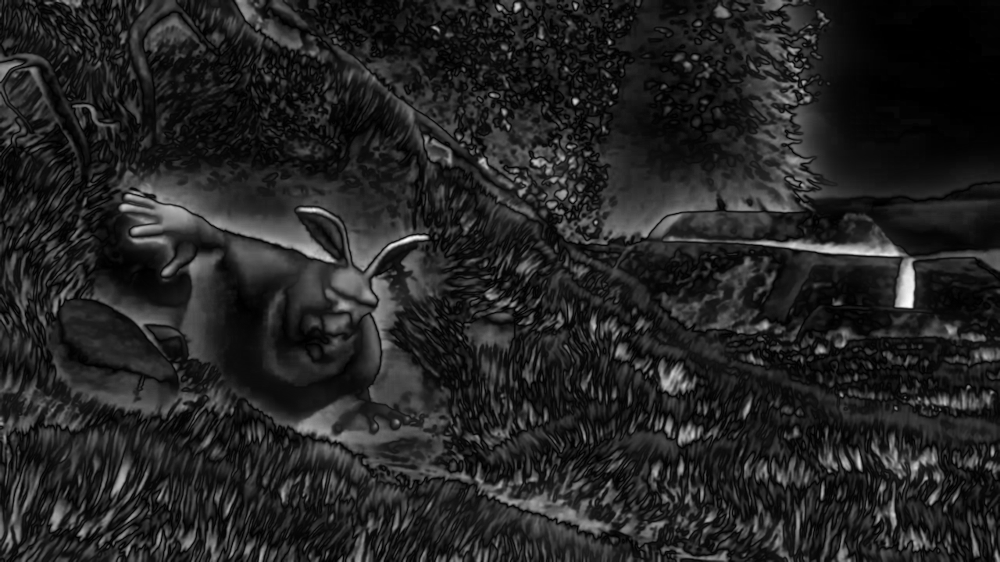

Frame 10


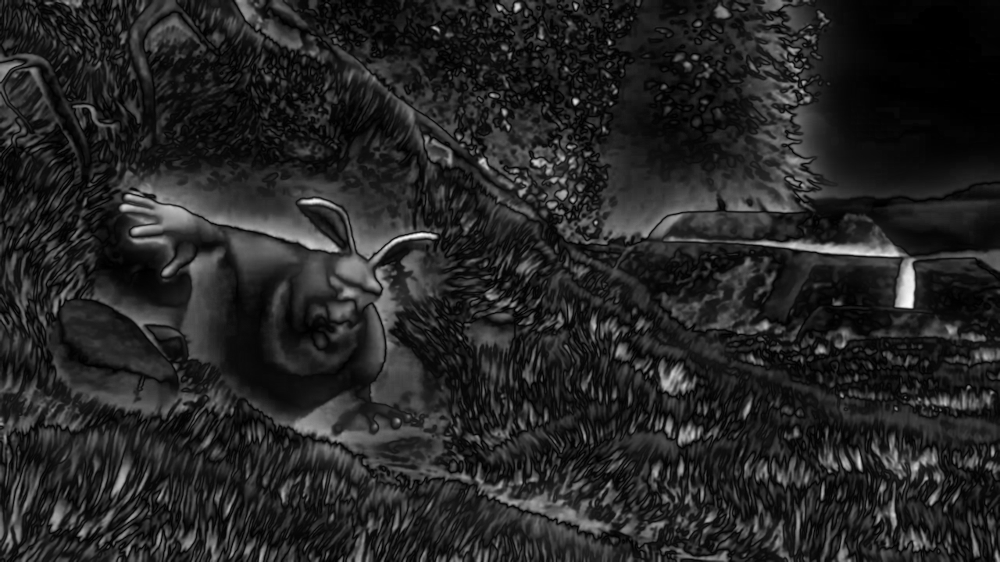

In [2]:
from google.colab.patches import cv2_imshow
import cv2

# Load the video
cap = cv2.VideoCapture("v1.mp4")

# Create saliency detector
saliency = cv2.saliency.StaticSaliencyFineGrained_create()

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret or frame_count > 10:  # Limit to 10 frames for demo
        break

    success, saliencyMap = saliency.computeSaliency(frame)
    saliencyMap = (saliencyMap * 255).astype("uint8")

    print(f"Frame {frame_count}")
    cv2_imshow(saliencyMap)

    frame_count += 1

cap.release()


 Part 2: Unsupervised Image Segmentation using K-Means

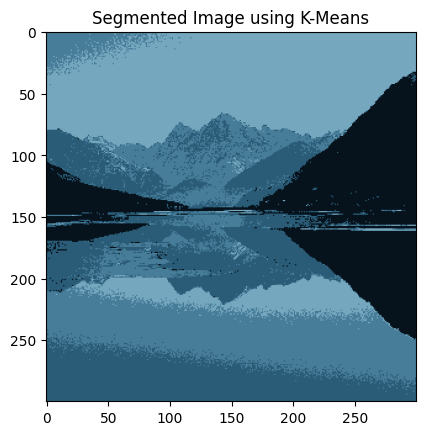

In [3]:
import numpy as np
from sklearn.cluster import KMeans

image = cv2.imread('p1.jpg')
image = cv2.resize(image, (300, 300))
Z = image.reshape((-1, 3))

Z = np.float32(Z)
k = 4
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
_, label, center = cv2.kmeans(Z, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
res = center[label.flatten()]
segmented_image = res.reshape((image.shape))

plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Image using K-Means")
plt.show()


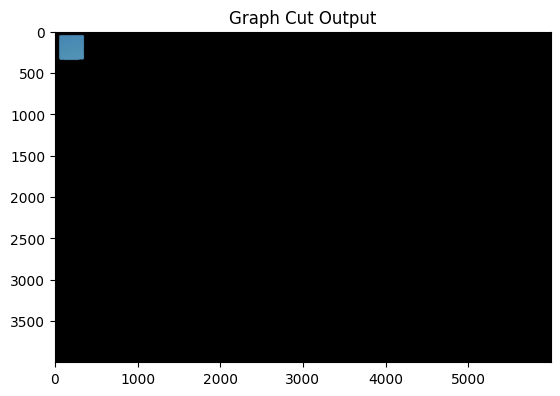

In [4]:
import numpy as np
import cv2

img = cv2.imread("p1.jpg")
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Define ROI rectangle
rect = (50, 50, 300, 300)
cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# Final mask
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img_cut = img * mask2[:, :, np.newaxis]

plt.imshow(cv2.cvtColor(img_cut, cv2.COLOR_BGR2RGB))
plt.title("Graph Cut Output")
plt.show()


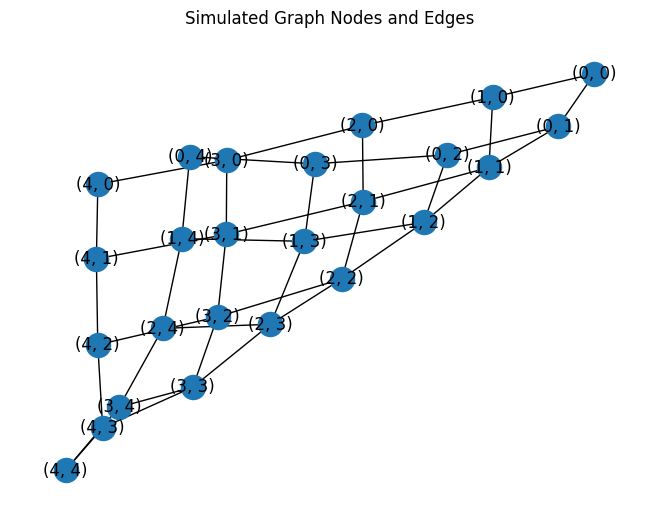

In [5]:
import networkx as nx
G = nx.grid_2d_graph(5, 5)  # Simulated example
nx.draw(G, with_labels=True)
plt.title("Simulated Graph Nodes and Edges")
plt.show()


In [6]:
from google.colab import files
files.upload()  # Upload your kaggle.json

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [7]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("pevogam/ucf101")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/ucf101


In [8]:
import os

# Check the folder structure under UCF101
dataset_path = '/kaggle/input/ucf101/UCF101'
for root, dirs, files in os.walk(dataset_path):
    print("📁", root)
    for d in dirs:
        print(" ┣━", d)
    for f in files[:5]:  # Show only first 5 files to avoid overload
        print(" ┗━", f)
    break  # Only show top-level content for now


📁 /kaggle/input/ucf101/UCF101
 ┣━ UCF-101


In [9]:
import cv2
import os
import numpy as np

def extract_frames(video_path, output_path, size=(64, 64), max_frames=32):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count = 0

    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, size)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        count += 1

    cap.release()
    frames = np.array(frames, dtype=np.float32) / 255.0  # Normalize to [0, 1]

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.save(output_path, frames)
    print(f"✅ Saved: {output_path}")

# Set base paths
base_path = "/kaggle/input/ucf101/UCF101/UCF-101"
output_base = "/kaggle/working/processed_videos"

# Pick 5 clips from each class
classes = ["JumpingJack", "PushUps"]

for cls in classes:
    cls_path = os.path.join(base_path, cls)
    videos = sorted(os.listdir(cls_path))[:5]  # Pick first 5 videos
    for vid in videos:
        input_video = os.path.join(cls_path, vid)
        output_npy = os.path.join(output_base, cls, vid.replace(".avi", ".npy"))
        extract_frames(input_video, output_npy)


✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c01.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c02.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c03.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c04.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c05.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c01.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c02.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c03.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c04.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c05.npy


In [10]:
import tensorflow as tf
from tensorflow.keras import layers, models

latent_dim = 100
video_shape = (32, 64, 64, 3)  # (time, height, width, channels)

def build_generator():
    model = models.Sequential()
    model.add(layers.Input(shape=(latent_dim,)))

    # Initial dense layer and reshape
    model.add(layers.Dense(4*8*8*512))
    model.add(layers.Reshape((4, 8, 8, 512)))  # (T=4, H=8, W=8, C=512)

    # Transposed convolutions to reach (32, 64, 64, 3)
    model.add(layers.Conv3DTranspose(256, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))  # 8x16x16
    model.add(layers.Conv3DTranspose(128, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))  # 16x32x32
    model.add(layers.Conv3DTranspose(64, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))   # 32x64x64
    model.add(layers.Conv3DTranspose(3, (3,3,3), activation='sigmoid', padding='same'))  # Final: (32, 64, 64, 3)

    return model

def build_discriminator():
    model = models.Sequential()
    model.add(layers.Conv3D(64, kernel_size=4, strides=2, padding='same', input_shape=video_shape))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3D(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3D(256, kernel_size=4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model

In [11]:
generator = build_generator()
discriminator = build_discriminator()

noise = tf.random.normal([1, latent_dim])
generated_video = generator(noise)
print("Generated video shape:", generated_video.shape)  # (1, 32, 64, 64, 3)

decision = discriminator(generated_video)
print("Discriminator output:", decision.shape)  # (1, 1)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Generated video shape: (1, 32, 64, 64, 3)
Discriminator output: (1, 1)


In [12]:
import glob

def load_dataset(path):
    npy_files = glob.glob(os.path.join(path, '**', '*.npy'), recursive=True)
    data = [np.load(f) for f in npy_files]
    data = [d if d.shape[0] == 32 else np.pad(d, ((0, 32 - d.shape[0]), (0,0), (0,0), (0,0)), mode='constant') for d in data]
    return np.array(data)

videos = load_dataset('/kaggle/working/processed_videos')
print("Loaded videos:", videos.shape)  # (N, 32, 64, 64, 3)

# Create tf.data.Dataset
batch_size = 2
dataset = tf.data.Dataset.from_tensor_slices(videos).shuffle(buffer_size=10).batch(batch_size)


Loaded videos: (10, 32, 64, 64, 3)


In [13]:
generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real_output, fake_output):
    return cross_entropy(tf.ones_like(real_output), real_output) + \
           cross_entropy(tf.zeros_like(fake_output), fake_output)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

@tf.function
def train_step(real_videos):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_videos = generator(noise, training=True)

        real_output = discriminator(real_videos, training=True)
        fake_output = discriminator(generated_videos, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_gen, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_disc, discriminator.trainable_variables))

    return gen_loss, disc_loss

# Training Loop
import time
epochs = 50

for epoch in range(epochs):
    start = time.time()
    for video_batch in dataset:
        g_loss, d_loss = train_step(video_batch)
    print(f"Epoch {epoch+1}, Gen Loss: {g_loss:.4f}, Disc Loss: {d_loss:.4f}, Time: {time.time() - start:.2f}s")


Epoch 1, Gen Loss: 1.0641, Disc Loss: 0.9589, Time: 4.71s
Epoch 2, Gen Loss: 2.1362, Disc Loss: 0.3041, Time: 0.53s
Epoch 3, Gen Loss: 5.7123, Disc Loss: 0.0081, Time: 0.53s
Epoch 4, Gen Loss: 8.1295, Disc Loss: 0.0004, Time: 0.52s
Epoch 5, Gen Loss: 7.4301, Disc Loss: 0.0008, Time: 0.52s
Epoch 6, Gen Loss: 7.7822, Disc Loss: 0.2107, Time: 0.52s
Epoch 7, Gen Loss: 20.6163, Disc Loss: 7.0150, Time: 0.52s
Epoch 8, Gen Loss: 0.3302, Disc Loss: 4.5953, Time: 0.52s
Epoch 9, Gen Loss: 13.2143, Disc Loss: 0.0074, Time: 0.53s
Epoch 10, Gen Loss: 4.7388, Disc Loss: 0.0312, Time: 0.53s
Epoch 11, Gen Loss: 1.3148, Disc Loss: 0.3148, Time: 0.53s
Epoch 12, Gen Loss: 9.1004, Disc Loss: 0.0363, Time: 0.52s
Epoch 13, Gen Loss: 12.3650, Disc Loss: 0.0614, Time: 0.52s
Epoch 14, Gen Loss: 11.7551, Disc Loss: 0.0135, Time: 0.52s
Epoch 15, Gen Loss: 9.9282, Disc Loss: 0.0000, Time: 0.52s
Epoch 16, Gen Loss: 8.1781, Disc Loss: 0.0013, Time: 0.52s
Epoch 17, Gen Loss: 6.6089, Disc Loss: 0.0014, Time: 0.53s
Ep

In [14]:
def save_generated_video(generated_frames, output_filename='generated_video.avi'):
    out = cv2.VideoWriter(output_filename, cv2.VideoWriter_fourcc(*'XVID'), 25, (64, 64))
    for frame in generated_frames:
        out.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))  # Convert back to BGR for OpenCV
    out.release()
    print(f"Generated video saved as {output_filename}")


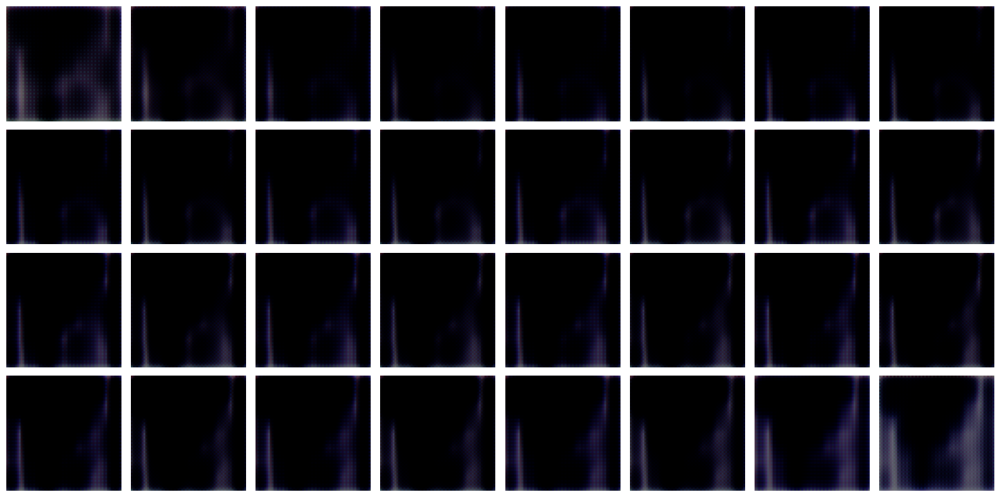

In [15]:
import matplotlib.pyplot as plt

def show_generated_video():
    noise = tf.random.normal([1, latent_dim])
    generated = generator(noise, training=False).numpy()[0]

    fig, axes = plt.subplots(4, 8, figsize=(16, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(generated[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

show_generated_video()
